# COGS 118B - Positional Analysis using Clustering Unsupervised Machine Learning Models on FIFA Dataset

## Group members

- Kavin G Raj
- Michael Daoud 
- Shay Samat
- Hyun Choi
- Akhil Vasanth

# Abstract 
We have accumulated data from the hit video game series EA FIFA now known as EAFC. Using the data from the game, our goal is to see if we can use the clustering methods learned in the course to group players based on several performance statistics and test how well the model was able to differentiate player positions. With data collected from the video game we will be conducting clustering models.


# Background

Prior work has shown that clustering in sports research has been used commonly to investigate many problems in sports. Clustering is used so often because members of the same cluster are likely to have similar responses than members of a different cluster, and it is often easier to sample from clusters of individuals, such as sports teams, instead of individuals<a name="hayen"></a>[<sup>[1]</sup>](#hayennote). There have been many projects and studies where clustering has been used to analyze player data and determine the positions of players based on their clusters. Clustering methods like partition clustering has been used to cluster soccer players based on their performance data to analyze the composition of teams and find players similar to other given players <a name="akhanli"></a>[<sup>[2]</sup>](#akhanlinote). Additionally, techniques like K-Means Clustering and Model Based Clustering have been used to identify new, unique clusters of NBA players that are more informative than standard player positions <a name="stern"></a>[<sup>[3]</sup>](#sternnote). Due to the prevalence of clustering in sport our project would allow people to easily filter and discriminate between players based on their performance to see what type of player they want. 


# Problem Statement

Soccer is a very fluid game, making it hard to determine players position with just stats. Our problem is, how accurately can player statistics in the game predict the position of a player based on its similarity to other players? 


# Data

Data: https://www.kaggle.com/datasets/stefanoleone992/ea-sports-fc-24-complete-player-dataset?select=male_players.csv

Initials Size of Dataset: 109 Variables, 180021 Observations

Each dataset consists of name, club, nationality, preferred foot, attack stats, defending stats, dribbling stats, goalie stats, mentality, DOB, etc. for every player who was in the FIFA video game from 2014 to 2024. The critical values would be all the attack, defender, and dribbling stats which are written as a number from 0-100. Each of these mentioned stats has a more specific stat for each action. For example, attack would have attack_crossing, attack_finishing, attack_shortpassing. There are a lot of extra columns such as nationality, club jersey, league name, etc. We will remove some of these columns in the dataset. We also plan on just using FIFA 24, so we will remove any row that is not in FIFA 24. 

# Proposed Solution

Our proposed solution is to use K-Means Clustering to group players into 4 clusters for goalies, defenders, midfielders, and attackers and evaluate the clusters by using silhouette scores and other evaluations metrics. We will also see how accurate the clusters are to clusters based on their actual positions by using an adjusted Rand index. We plan to use the scikit-learn library to implement the K-means clustering algorithm and to check the accuracy of clusters using the built in functions to calculate the Adjusted Rand Index and silhouette scores.

# Evaluation Metrics

After obtaining clusters from K-means Clustering, we will assess the effectiveness of the clustering in grouping players based on performance statistics by utilizing Silhouette score. The Silhouette Score measures how similar a data point is to its own cluster in comparison to other clusters, with the score ranging from -1 to 1.
Formula of the Silhouette Score <a name="akhanli"></a>[<sup>[4]</sup>](#akhanlinote) :
$s(i) = \frac{b(i) - a(i)}{max(a(i), b(i))}$
Where a(i) is the mean distance between a sample and all other points in the same class, and b(i) is the mean distance between a sample and all other points in the nearest cluster.


Then, we will validate our clustering with the Adjusted Rand Index since cluster labels do not inherently represent the label and actual grouping, making direct validation challenging. The Adjusted Rand Index is used to compare the clusters formed by K-means clustering with the ground truth. In our case, this involves comparing the positions assigned to players within the clusters against their actual position. Importantly, the ARI <a name="stern"></a>[<sup>[5]</sup>](#sternnote) also accounts for the possibility that some agreement between the clustering and the ground truth could happen just by chance. At the end, ARI provides a score between -1 and 1.

Adjusted Rand Index:


$$
\text{ARI} = \frac{\sum_{ij} \binom{n_{ij}}{2} - \left[ \sum_i \binom{a_i}{2} \sum_j \binom{b_j}{2} \right] / \binom{n}{2}}{\frac{1}{2} \left[ \sum_i \binom{a_i}{2} + \sum_j \binom{b_j}{2} \right] - \left[ \sum_i \binom{a_i}{2} \sum_j \binom{b_j}{2} \right] / \binom{n}{2}}
$$


where:
- $n_{ij}$ is the number of objects in both cluster $i$ and cluster $j$.
- $a_i$ is the number of objects in cluster $i$.
- $b_j$ is the number of objects in cluster $j$.
- $n$ is the total number of objects.
- $\binom{x}{2} = \frac{x(x-1)}{2}$ represents the binomial coefficient, i.e., the number of pairs that can be formed from $x$ items.  



By utilizing the Silhouette Score, we can internally validate the quality of the K-Mean Clustering and can externally validate the K-Mean Clustering using Adjusted Rand Index, comparing the formed clusters against the ground truth of the player's positions. This evaluation comprehensively captures the performance of our unsupervised learning algorithm in predicting player positions based on performance statistics.


# Data Cleaning

We removed any columns that are irrelevant to the analysis of our dataset. These would include player_url, short_name, long_name, potential, value_eur, etc. We remove all players that are not in FIFA 24. We removed all players with missing values. There are quite literally an infinite number of positions in soccer. But in FIFA there are 16 positions listed. A lot of these positions are quite similar to each other so we grouped these positions into broad categories: defender positions, midfielder positions, forward positions, and goalkeeper positions. We run this grouping when doing true labeling. This will be useful later when we try to get a comparison of the models we made and with the actual results from the true labeling.

# Results

## Preprocessing (Data Wrangling)

In [1]:
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, adjusted_rand_score, rand_score
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.mixture import GaussianMixture
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from umap import UMAP
import plotly.express as px
from sklearn.model_selection import ParameterGrid
from sklearn.preprocessing import LabelEncoder

c:\Users\Harry Hyun Woo Choi\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
male_players = pd.read_csv('data/male_players.csv')
male_players

C:\Users\Harry Hyun Woo Choi\AppData\Local\Temp\ipykernel_19992\2510204913.py:1: DtypeWarning: Columns (108) have mixed types. Specify dtype option on import or set low_memory=False.
  male_players = pd.read_csv('data/male_players.csv')


,player_id,player_url,fifa_version,fifa_update,update_as_of,short_name,long_name,player_positions,overall,potential,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk
0,231747,/player/231747/kylian-mbappe/240002,24.0,2.0,2023-09-22,K. Mbappé,Kylian Mbappé Lottin,"ST, LW",91,94,...,63+3,63+3,63+3,68+3,63+3,54+3,54+3,54+3,63+3,18+3
1,239085,/player/239085/erling-haaland/240002,24.0,2.0,2023-09-22,E. Haaland,Erling Braut Haaland,ST,91,94,...,63+3,63+3,63+3,62+3,60+3,62+3,62+3,62+3,60+3,19+3
2,192985,/player/192985/kevin-de-bruyne/240002,24.0,2.0,2023-09-22,K. De Bruyne,Kevin De Bruyne,"CM, CAM",91,91,...,80+3,80+3,80+3,79+3,75+3,70+3,70+3,70+3,75+3,21+3
3,158023,/player/158023/lionel-messi/240002,24.0,2.0,2023-09-22,L. Messi,Lionel Andrés Messi Cuccittini,"CF, CAM",90,90,...,63+3,63+3,63+3,64+3,59+3,49+3,49+3,49+3,59+3,19+3
4,165153,/player/165153/karim-benzema/240002,24.0,2.0,2023-09-22,K. Benzema,Karim Benzema,"CF, ST",90,90,...,64+3,64+3,64+3,64+3,60+3,55+3,55+3,55+3,60+3,18+3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180016,220806,https://sofifa.com/player/220806/ellis-redman/...,15.0,2.0,2014-09-18,E. Redman,Ellis Redman,CB,41,61,...,38,38,38,37,40,41,41,41,40,10
180017,225509,https://sofifa.com/player/225509/aaron-collins...,15.0,2.0,2014-09-18,A. Collins,Aaron Graham John Collins,ST,41,50,...,30,30,30,31,32,31,31,31,32,14
180018,217591,https://sofifa.com/player/217591/piotr-zemlo/1...,15.0,2.0,2014-09-18,P. Żemło,Piotr Żemło,"LM, LB",40,50,...,46,46,46,48,51-1,53-3,53-3,53-3,51-1,12
180019,222947,https://sofifa.com/player/222947/tom-davies/15...,15.0,2.0,2014-09-18,T. Davies,Thomas Christopher Davies,CB,40,49,...,36,36,36,37,39,40,40,40,39,13


In [3]:
# drop the columns that are unrelevant to our anaylsis 
male_players = male_players.drop(['player_url','short_name', 'long_name',
                                  'potential','value_eur','wage_eur','age',
                                  'dob','club_team_id','club_name','league_id',
                                  'league_name','league_level','club_position','club_jersey_number',
                                  'club_loaned_from','club_joined_date','club_contract_valid_until_year',
                                  'nationality_id','nationality_name', 'nation_team_id','nation_position',
                                  'nation_jersey_number','international_reputation','body_type','real_face',
                                  'release_clause_eur','player_tags','player_traits', 'fifa_update', 'goalkeeping_speed',
                                    'shooting', 'passing', 'physic', 'defending', 'dribbling', 'pace', 'mentality_composure'], axis = 1)
male_players

,player_id,fifa_version,update_as_of,player_positions,overall,height_cm,weight_kg,preferred_foot,weak_foot,skill_moves,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk
0,231747,24.0,2023-09-22,"ST, LW",91,182,75,Right,4,5,...,63+3,63+3,63+3,68+3,63+3,54+3,54+3,54+3,63+3,18+3
1,239085,24.0,2023-09-22,ST,91,195,94,Left,3,3,...,63+3,63+3,63+3,62+3,60+3,62+3,62+3,62+3,60+3,19+3
2,192985,24.0,2023-09-22,"CM, CAM",91,181,75,Right,5,4,...,80+3,80+3,80+3,79+3,75+3,70+3,70+3,70+3,75+3,21+3
3,158023,24.0,2023-09-22,"CF, CAM",90,169,67,Left,4,4,...,63+3,63+3,63+3,64+3,59+3,49+3,49+3,49+3,59+3,19+3
4,165153,24.0,2023-09-22,"CF, ST",90,185,81,Right,4,4,...,64+3,64+3,64+3,64+3,60+3,55+3,55+3,55+3,60+3,18+3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180016,220806,15.0,2014-09-18,CB,41,187,81,Right,2,2,...,38,38,38,37,40,41,41,41,40,10
180017,225509,15.0,2014-09-18,ST,41,178,57,Right,3,3,...,30,30,30,31,32,31,31,31,32,14
180018,217591,15.0,2014-09-18,"LM, LB",40,190,76,Left,3,2,...,46,46,46,48,51-1,53-3,53-3,53-3,51-1,12
180019,222947,15.0,2014-09-18,CB,40,180,70,Right,2,2,...,36,36,36,37,39,40,40,40,39,13


In [4]:
# Only include players from the latest version of the game
pd.set_option('display.max_rows', 10)
male_players_24 = male_players[male_players['fifa_version'] == 24.0]
male_players_24 

,player_id,fifa_version,update_as_of,player_positions,overall,height_cm,weight_kg,preferred_foot,weak_foot,skill_moves,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk
0,231747,24.0,2023-09-22,"ST, LW",91,182,75,Right,4,5,...,63+3,63+3,63+3,68+3,63+3,54+3,54+3,54+3,63+3,18+3
1,239085,24.0,2023-09-22,ST,91,195,94,Left,3,3,...,63+3,63+3,63+3,62+3,60+3,62+3,62+3,62+3,60+3,19+3
2,192985,24.0,2023-09-22,"CM, CAM",91,181,75,Right,5,4,...,80+3,80+3,80+3,79+3,75+3,70+3,70+3,70+3,75+3,21+3
3,158023,24.0,2023-09-22,"CF, CAM",90,169,67,Left,4,4,...,63+3,63+3,63+3,64+3,59+3,49+3,49+3,49+3,59+3,19+3
4,165153,24.0,2023-09-22,"CF, ST",90,185,81,Right,4,4,...,64+3,64+3,64+3,64+3,60+3,55+3,55+3,55+3,60+3,18+3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18345,273759,24.0,2023-09-22,CB,47,176,76,Left,3,2,...,39+2,39+2,39+2,41+2,43+2,47+2,47+2,47+2,43+2,13+2
18346,269013,24.0,2023-09-22,CB,47,183,74,Right,3,2,...,43+2,43+2,43+2,44+2,46+2,47+2,47+2,47+2,46+2,13+2
18347,272748,24.0,2023-09-22,ST,47,184,65,Right,2,2,...,31+2,31+2,31+2,35+2,33+2,27+2,27+2,27+2,33+2,13+2
18348,269534,24.0,2023-09-22,CM,47,178,74,Right,3,2,...,45+2,45+2,45+2,45+2,45+2,44+2,44+2,44+2,45+2,14+2


# Feature Engineering

In [5]:
# define broad categories
# Change specific positions to broad positions
defender_positions = {'CB', 'LB', 'RB', 'LWB', 'RWB', 'DB'}
midfielder_positions = {'CM', 'CAM', 'CDM', 'LM', 'RM'}
forward_positions = {'CF', 'ST', 'LW', 'RW'}
goalkeeper_position = {'GK'}

In [6]:
def generalize_position(position):
    positions = position.replace(' ', '').split(',')
    for pos in positions:
        if pos in goalkeeper_position:
            return 'GK'
        elif pos in defender_positions:
            return 'D'
        elif pos in midfielder_positions:
            return 'M'
        elif pos in forward_positions:
            return 'F'
    return 'Unknown'

In [7]:
# Apply function to player positions
male_players_24['broad_position'] = male_players_24['player_positions'].apply(generalize_position)

male_players_24['broad_position'].unique()

C:\Users\Harry Hyun Woo Choi\AppData\Local\Temp\ipykernel_19992\1509442758.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  male_players_24['broad_position'] = male_players_24['player_positions'].apply(generalize_position)


array(['F', 'M', 'GK', 'D'], dtype=object)

In [8]:
male_players_24.dtypes[::-1][:10]

broad_position    object
gk                object
rb                object
rcb               object
cb                object
lcb               object
lb                object
rwb               object
rdm               object
cdm               object
dtype: object

In [9]:
# remove + or - symbols in player's stats
male_players_24 = male_players_24.copy()

def remove_symbols_and_convert_int(value):
    value = str(value)
    if pd.isna(value):
        return np.nan
    # split the string at '+' or '-' and convert to integer
    for char in ['+', '-']:
        if char in value:
            return int(value.split(char)[0])
    # if neither '+' nor '-' is in the value, just convert it to integer
    return int(value)

columns_to_process = ['ls', 'st', 'rs',
       'lw', 'lf', 'cf', 'rf', 'rw', 'lam', 'cam', 'ram', 'lm', 'lcm', 'cm',
       'rcm', 'rm', 'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb',
       'rcb', 'rb', 'gk']

for column in columns_to_process:
    male_players_24.loc[:, column] = male_players_24[column].apply(remove_symbols_and_convert_int)

male_players_24

,player_id,fifa_version,update_as_of,player_positions,overall,height_cm,weight_kg,preferred_foot,weak_foot,skill_moves,...,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk,broad_position
0,231747,24.0,2023-09-22,"ST, LW",91,182,75,Right,4,5,...,63,63,68,63,54,54,54,63,18,F
1,239085,24.0,2023-09-22,ST,91,195,94,Left,3,3,...,63,63,62,60,62,62,62,60,19,F
2,192985,24.0,2023-09-22,"CM, CAM",91,181,75,Right,5,4,...,80,80,79,75,70,70,70,75,21,M
3,158023,24.0,2023-09-22,"CF, CAM",90,169,67,Left,4,4,...,63,63,64,59,49,49,49,59,19,F
4,165153,24.0,2023-09-22,"CF, ST",90,185,81,Right,4,4,...,64,64,64,60,55,55,55,60,18,F
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18345,273759,24.0,2023-09-22,CB,47,176,76,Left,3,2,...,39,39,41,43,47,47,47,43,13,D
18346,269013,24.0,2023-09-22,CB,47,183,74,Right,3,2,...,43,43,44,46,47,47,47,46,13,D
18347,272748,24.0,2023-09-22,ST,47,184,65,Right,2,2,...,31,31,35,33,27,27,27,33,13,F
18348,269534,24.0,2023-09-22,CM,47,178,74,Right,3,2,...,45,45,45,45,44,44,44,45,14,M


### EDA

In [10]:
# check if any na values still remain
missing = male_players_24.isna().sum()
missing.sort_values(ascending= False)

player_id                0
fifa_version             0
lam                      0
rw                       0
rf                       0
                        ..
movement_agility         0
movement_sprint_speed    0
movement_acceleration    0
skill_ball_control       0
broad_position           0
Length: 72, dtype: int64

In [11]:
# number of players in each position's
male_players_24.groupby('broad_position')['player_id'].count()

broad_position
D     6174
F     3458
GK    2045
M     6673
Name: player_id, dtype: int64

# Baseline Model

In [12]:
#here are the relevant features that we will use in our clustering
keeping_features = [
       'attacking_crossing', 'attacking_finishing',
       'attacking_heading_accuracy', 'attacking_short_passing',
       'attacking_volleys', 'skill_dribbling', 'skill_curve',
       'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control',
       'movement_acceleration', 'movement_sprint_speed', 'movement_agility',
       'movement_reactions', 'movement_balance', 'power_shot_power',
       'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots',
       'mentality_aggression', 'mentality_interceptions',
       'mentality_positioning', 'mentality_vision',
        'defending_marking_awareness',
       'defending_standing_tackle', 'defending_sliding_tackle',
       'goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking',
       'goalkeeping_positioning', 'goalkeeping_reflexes', 'ls', 'st', 'rs',
       'lw', 'lf', 'cf', 'rf', 'rw', 'lam', 'cam', 'ram', 'lm', 'lcm', 'cm',
       'rcm', 'rm', 'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb',
       'rcb', 'rb', 'gk']

X = male_players_24[keeping_features]

# compare the ground truth for metrics
true_labels = male_players_24['broad_position']

In [13]:
# check the range to see if we need standardization
min_value = X.min().min()
max_value = X.max().max()

print("Minimum value in X:", min_value)
print("Maximum value in X:", max_value)

Minimum value in X: 2
Maximum value in X: 97


In [14]:
# we don't need to standardize the values since the range is 0-100
# X_scaled = StandardScaler().fit_transform(X)
# X_scaled is not scaled actually
X_scaled = X.copy()

## Dimensionality Reduction

### PCA

We decided to use PCA to help us find patterns and reduce the complexity of our dataset, while also being able to preserve most of the information. Because our Fifa 24 data contains so many features describing player attributes, such as physical, technical, and mental characteristics, we felt that PCA can help reduce the dimensionality of the dataset by transforming these high-dimensional feature spaces into a lower-dimensional space while preserving most of the variance. This can make the clustering task more computationally efficient and less prone to overfitting. We set our PCA component to 0.90, and fit the data. Our *explained_variance_ratio* was distributed as [0.67850301 0.16480112 0.04595538 0.03210933]. Based on these results, we can see that the first principal component has 67.85% of the variance in the dataset. This means that a significant portion of the information in our dataset can be represented along this first principal component dimension. If we total these ratios up, we get a total variance of 92.1%, which suggests that the selected principal components retain a large proportion of the variability present in the original dataset and reduced-dimensional representation is obtained.

In [15]:
pca = PCA(n_components=0.90) # setting threshold to 90%
X_pca = pca.fit_transform(X_scaled)

In [16]:
print("Explained variance ratio:", pca.explained_variance_ratio_)
print("Total variance explained by all selected components:", sum(pca.explained_variance_ratio_))

Explained variance ratio: [0.67850301 0.16480112 0.04595538 0.03210933]
Total variance explained by all selected components: 0.9213688512713295


### 2D Plot PCA

Text(0.5, 1.0, 'PCA Projection - First Two Principal Components')

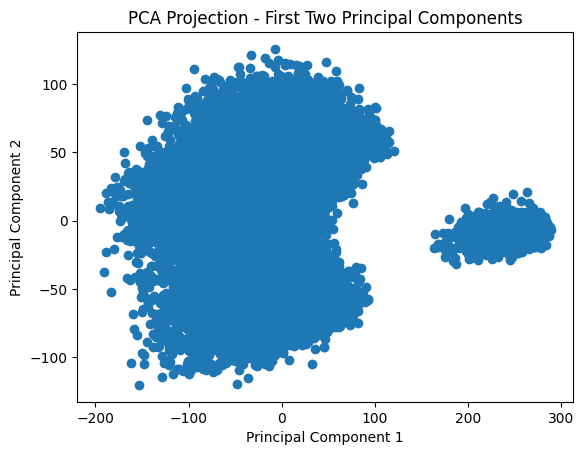

In [17]:
# scatter plot the pc1 and pc2
plt.scatter(X_pca[:, 0], X_pca[:, 1])
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Projection - First Two Principal Components')

Text(0, 0.5, 'PC 2')

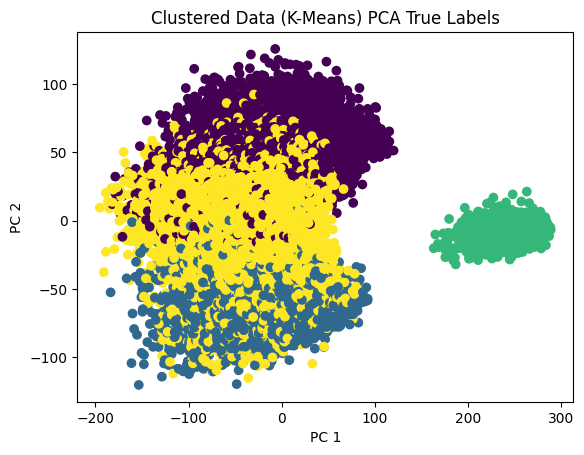

In [18]:
label_encoder = LabelEncoder()
labels_encoded = label_encoder.fit_transform(true_labels)

# true label for pca scatter plot
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=labels_encoded)
plt.title('Clustered Data (K-Means) PCA True Labels')
plt.xlabel('PC 1')
plt.ylabel('PC 2')

To get a better understanding of how PCA has been able to cluster the data, we needed to use a LabelEncoder for the scatter plot to color-code data points based on their corresponding labels, so we could visually see the results from clustering. The scatter plot is not enough to do the dimensionality reduction for 4 ground truth positions.  We can only observe 2 clusters: the small cluster will be the goalkeeper and the big cluster most likely contain the other 3 positions. The scatter plot does a fairly decent job of splitting the data into 4 positions. It did a great job clustering the goalies' positions, and the midfielder, defensive, and forward positions were clustered together, with overlapping points.

### 3D plot PCA

In [19]:
# true label for pca scatter 3d plot
fig = px.scatter_3d(
    x=X_pca[:, 0],
    y=X_pca[:, 1],
    z=X_pca[:, 2],
    color=true_labels,  # This automatically assigns colors based on the unique values in true_labels
    title='3D PCA Projection of the Dataset (Colored by True Labels)'
)

fig.update_layout(
    scene=dict(
        xaxis_title='PCA Component 1',
        yaxis_title='PCA Component 2',
        zaxis_title='PCA Component 3'
    ),
    margin=dict(l=0, r=0, b=0, t=0)
)

fig.show()

<img src="imgs/3d_pca_true.png" alt="3d_pca_true.png" title="3d_pca_true.png"/>

We were able to visualize the 3D PCA projection of our dataset and we noticed that PCA with 3 components did a fairly good job classifying goalkeepers and defenders. However, the attacker and midfielder position seemed to be scattered all over the place without any consistency. 

### More Components

In [20]:
# Additional PCA to 4 and 5 dimensions
pca_4 = PCA(n_components=4).fit_transform(X)
pca_5 = PCA(n_components=5).fit_transform(X)

We added more components to explore higher-dimensional representations of the data using PCA. By increasing the number of components to 4 and 5, we aim to capture more variance in the original dataset and uncover more complex patterns or structures that may not be discernible in lower-dimensional spaces.

## UMAP

We also decided to do another dimensionality reduction, UMAP. UMAP's ability to capture nonlinear relationships can help reveal the underlying structure and interactions between these attributes, providing insights into player profiles and characteristics. Some of the parameters we chose for UMAP was *n_neighbors* to 10, *min_dist* was 0.99, and “n_components* was set to 2. By setting the parameter n_neighbors to 10, we aimed to balance the local and global relationships within the data, ensuring that both nearby and distant data points are represented. We also decided to set min_dist to 0.99 to control the spacing between points and facilitate the visualization of clusters.

### 2D UMAP plots

In [21]:
umap = UMAP(n_neighbors=10, min_dist=0.99, n_components=2) # find the right parameter

# Fit UMAP and transform your data
X_umap = umap.fit_transform(X_scaled)

Text(0, 0.5, 'UMAP Component 2')

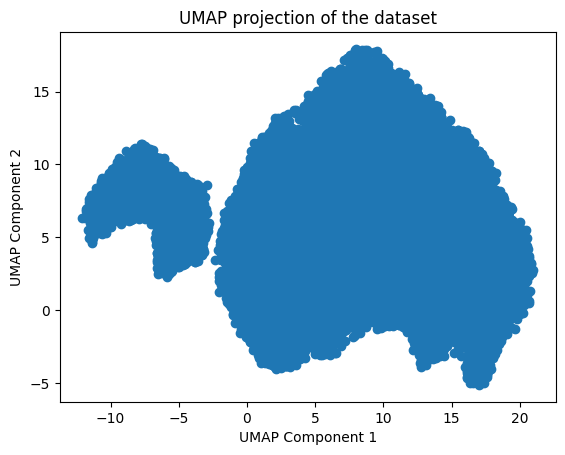

In [22]:
# Shape of uMAP 2d
plt.scatter(X_umap[:, 0], X_umap[:, 1])
plt.title('UMAP projection of the dataset')
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')

Text(0, 0.5, 'Component 2')

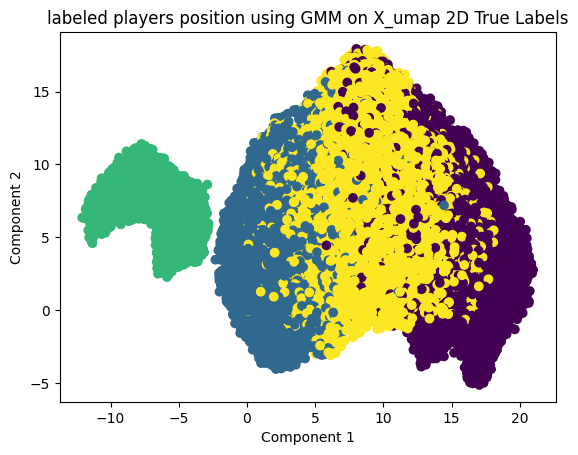

In [23]:
# True labels uMAP 2D 
plt.scatter(X_umap[:, 0], X_umap[:, 1], c=labels_encoded)
plt.title('labeled players position using GMM on X_umap 2D True Labels')
plt.xlabel('Component 1')
plt.ylabel('Component 2')

When plotting the UMAP using these parameters, UMAP performed well in terms of classifying goalkeepers, as they are in their own cluster and away from the other 3 positions. We weren’t able to see the 4 clusters separated, so instead we thought a 3D visualization would be better. 

### 3D Plot

In [56]:
# plot the true label in 3d

umap_3d = UMAP(n_neighbors=10, min_dist=0.99, n_components=3)

# Fit UMAP and transform your data
X_umap_3d = umap_3d.fit_transform(X_scaled)

fig = px.scatter_3d(
    x=X_umap_3d[:, 0],
    y=X_umap_3d[:, 1],
    z=X_umap_3d[:, 2],
    color=true_labels,
    title='3D UMAP Projection of the Dataset (Colored by True Labels)'
)

fig.update_layout(
    scene=dict(
        xaxis_title='UMAP Component 1',
        yaxis_title='UMAP Component 2',
        zaxis_title='UMAP Component 3'
    ),
    margin=dict(l=0, r=0, b=0, t=0)
)

<img src="imgs/3d_umap_true.png" alt="3d_umap_true.png" title="3d_umap_true.png"/>

We decided to change the parameter to 3 components and visualize the UMAP plot in 3D with their true labels color-coded. We noticed similar results to our PCA 2D plot, where there were overlapping points. The points to the far left of the defenders were correctly categorized, and the far right of the attackers were correctly categorized with very few errors. The common trend we are seeing is that the midfield position overlaps with the attacker/defender position a lot to the point where the midfield cluster isn’t that distinct. This would make sense because midfielders have attributes that are suited for attackers and defenders, so it makes sense that UMAP can’t necessarily differentiate as well.

In [25]:
# Additional UMAP to 4 and 5 dimensions
umap_4 = UMAP(n_components=4, random_state=42).fit_transform(X)
umap_5 = UMAP(n_components=5, random_state=42).fit_transform(X)

c:\Users\Harry Hyun Woo Choi\AppData\Local\Programs\Python\Python311\Lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.

c:\Users\Harry Hyun Woo Choi\AppData\Local\Programs\Python\Python311\Lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



### t-SNE

We also decided to try t-SNE as another way of reducing the dimensionality. We aimed to capture non-linear relationships between player attributes while preserving both local and global structures in the data and comparing them with UMAP. We set “n_components* was set to 2, and *random_state* to 42 to ensure reproducibility across different runs of the algorithm. Through t-SNE's ability to produce visually interpretable embeddings, we sought to gain insights into player profiles and characteristics, facilitating the identification of clusters representing distinct player positions.

In [26]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=42)  # Setting random_state for reproducibility
X_tsne = tsne.fit_transform(X)

### 2D Plot t-SNE

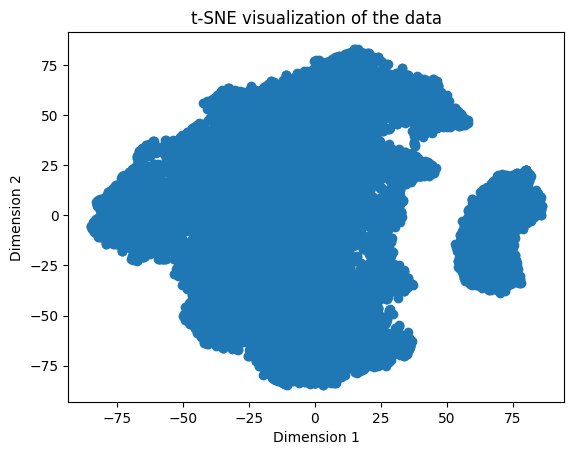

In [27]:
plt.scatter(X_tsne[:, 0], X_tsne[:, 1])  # Plotting the two dimensions
plt.title('t-SNE visualization of the data')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.show()

We noticed that the t-SNE 2D Plot received a bit more of a ragged edge of points plotted across the 2 dimensions in comparison to PCA and UMAP. Similar to the plots prior,  t-SNE was also to distinctly classify the goalkeepers into its cluster, while the other three positions were in a larger cluster. 

### 3D Plot t-SNE

In [28]:
tsne3d = TSNE(n_components=3, random_state=42)  # Setting random_state for reproducibility
X_tsne_3d = tsne3d.fit_transform(X)

In [29]:
fig = px.scatter_3d(
    x=X_tsne_3d[:, 0],
    y=X_tsne_3d[:, 1],
    z=X_tsne_3d[:, 2],
     color=true_labels,
    title='3D t-SNE projection of the dataset'
)

fig.update_layout(
    scene=dict(
        xaxis_title='t-SNE Component 1',
        yaxis_title='t-SNE Component 2',
        zaxis_title='t-SNE Component 3'
    )
)

<img src="imgs/3d_tsne_true.png" alt="3d_tsne_true.png" title="3d_tsne_true.png"/>

We noticed in the 3D plot, that when we saw how t-SNE classified defenders and attackers, UMAP did a better job of categorizing them. One reason for this might be a crowding problem, where distant data points in the high-dimensional space are often compressed together in the low-dimensional embedding. In UMAP, we were able to tune our  *min_dist*, which we didn’t use for t-SNE which could be one reason why t-SNE underperformed in comparison to UMAP.

# Clustering

### K-Means

We decided to use KMeans because it is a simple, efficient, and interpretable approach to analyzing player positions in the FIFA 24 dataset. Its scalability, interpretability, robustness to noise, and versatility make it a valuable tool for uncovering patterns and insights in player statistics data. We set *n_clusters* to 4 because we have 4 broad positions we want to cluster, goalkeeper, defender, midfielder, and attacker. 

In [30]:
kmeans = KMeans(n_clusters=4)
cluster_labels_k_umap = kmeans.fit_predict(X_umap)

kmeans = KMeans(n_clusters=4)
cluster_labels_k_pca = kmeans.fit_predict(X_pca)

array([2, 2, 2, ..., 3, 1, 1])

### 2D Plots with K-means

We decided to make a scatter plot of the predicted clustered KMeans using PCA and UMAP’s structure. We noticed that there were some similarities between these two 2D plots. For instance, this was the first time we had seen some of the goalkeepers misclassified in both structures, UMAP and PCA. Another similarity would be how the line was drawn between the attacker, midfielder, and defender. Some differences would be the shapes in which both plots structured their points. The PCA plot was more scattered and raggedy in terms of points, but the UMAP structured plot was smoother. 

Text(0, 0.5, 'PC 2')

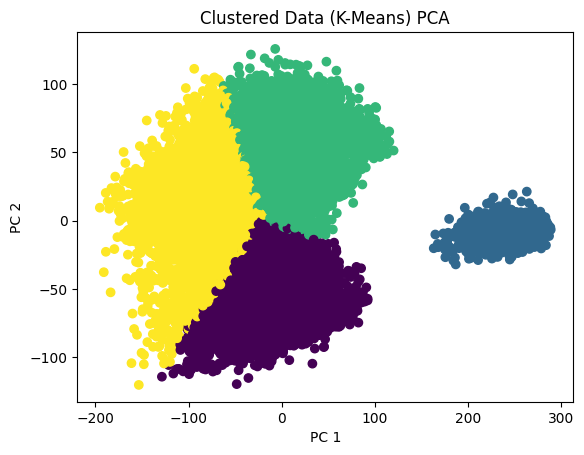

In [32]:
# scatter plot of the predicted clustered using k means using pca structure
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=cluster_labels_k_pca)
plt.title('Clustered Data (K-Means) PCA')
plt.xlabel('PC 1')
plt.ylabel('PC 2')

In [33]:
# calculate metrics 
silhouette_avg_k_pca = silhouette_score(X_pca, cluster_labels_k_pca)
print(f'Silhouette Score K means using PCA dataset: {silhouette_avg_k_pca:.2f}')
ari_k = adjusted_rand_score(true_labels, cluster_labels_k_pca)
print(f'Adjusted Rand Index: {ari_k:.2f}')

Silhouette Score K means using PCA dataset: 0.42
Adjusted Rand Index: 0.38


**Evaluation Metrics for KMeans using PCA Structure**

The silhouette score of 0.42 suggests that the clusters generated by KMeans using the PCA dataset are reasonably well-separated, with data points within clusters being closer to each other than to points in other clusters. The Adjusted Rand Index of 0.39 indicates a moderate level of agreement between the clusters produced by KMeans and the true labels. This means that the clustering algorithm partially captures the underlying structure of the data. Overall, while the clustering results demonstrate some degree of separation and agreement with the true labels, there is still room for improvement in accurately capturing the player positions based on the PCA-transformed dataset.

Text(0, 0.5, 'Component 2')

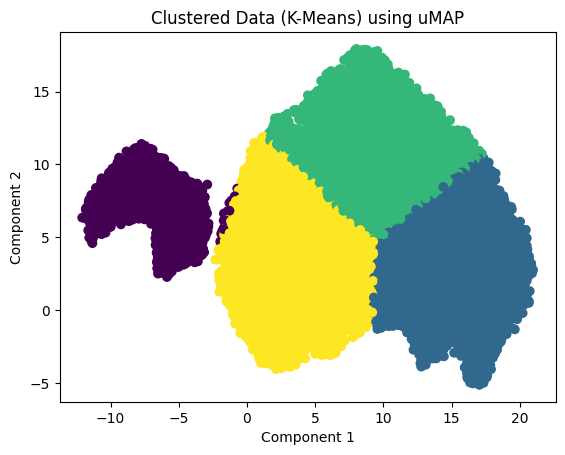

In [34]:
# using X_umap scatter plot of the predicted k-means clustered
plt.scatter(X_umap[:, 0], X_umap[:, 1], c=cluster_labels_k_umap)
plt.title('Clustered Data (K-Means) using uMAP')
plt.xlabel('Component 1')
plt.ylabel('Component 2')

In [35]:
# calculate metrics 
silhouette_avg_umap = silhouette_score(X_umap, cluster_labels_k_umap)
print(f'Silhouette Score K means using UMAP dataset: {silhouette_avg_umap:.2f}')
ari_k = adjusted_rand_score(true_labels, cluster_labels_k_umap)
print(f'Adjusted Rand Index: {ari_k:.2f}')

Silhouette Score K means using UMAP dataset: 0.44
Adjusted Rand Index: 0.39


**Evaluation Metrics for KMeans using UMAP Structure**

The silhouette score of 0.44 for UMAP with KMeans suggests that the clusters obtained from the UMAP s
tructured data are slightly better separated compared to the PCA structured dataset, with tighter clusters and more distinct boundaries between them. The adjusted Rand index of 0.39 indicates a similar level of agreement between the clusters produced by KMeans and the true labels, suggesting that UMAP with KMeans achieves comparable clustering performance to PCA with KMeans. Overall, the results suggest that UMAP may offer a slight improvement in clustering quality compared to PCA for this specific dataset and clustering algorithm.

In [36]:
kmeans_4d = KMeans(n_clusters=4, random_state=42)  # Adjust the number_of_clusters as needed
labels_4d_pca = kmeans_4d.fit_predict(pca_4)
labels_4d_umap = kmeans_4d.fit_predict(umap_4)

# Calculate metrics
ari_4d_pca = adjusted_rand_score(true_labels, labels_4d_pca)
print(f"ARI for 4-dimensional PCA with KMeans: {ari_4d_pca}")
silhouette_avg_4d_pca = silhouette_score(pca_4, labels_4d_pca)
print(f'Silhouette Score for 4D PCA with KMeans: {silhouette_avg_4d_pca:.2f}')

ari_4d_umap = adjusted_rand_score(true_labels, labels_4d_umap)
print(f"ARI for 4-dimensional u-MAP with KMeans: {ari_4d_umap}")
silhouette_avg_4d_umap = silhouette_score(umap_4, labels_4d_umap)
print(f'Silhouette Score for 4D UMAP with KMeans: {silhouette_avg_4d_umap:.2f}')

kmeans_5d = KMeans(n_clusters=4, random_state=42)  # Adjust the number_of_clusters as needed
labels_5d_pca = kmeans_5d.fit_predict(pca_5)
labels_5d_umap = kmeans_5d.fit_predict(umap_5)

# Calculate ARI
ari_5d_pca = adjusted_rand_score(true_labels, labels_5d_pca)
print(f"ARI for 5-dimensional PCA with KMeans: {ari_5d_pca}")
silhouette_avg_5d_pca = silhouette_score(pca_5, labels_5d_pca)
print(f'Silhouette Score for 5D PCA with KMeans: {silhouette_avg_5d_pca:.2f}')

ari_5d_umap = adjusted_rand_score(true_labels, labels_5d_umap)
print(f"ARI for 5-dimensional u-MAP with KMeans: {ari_5d_umap}")
silhouette_avg_5d_umap = silhouette_score(umap_5, labels_5d_umap)
print(f'Silhouette Score for 5D UMAP with KMeans: {silhouette_avg_5d_umap:.2f}')

ARI for 4-dimensional PCA with KMeans: 0.3753531534181046
Silhouette Score for 4D PCA with KMeans: 0.43
ARI for 4-dimensional u-MAP with KMeans: 0.3948726338599669
Silhouette Score for 4D UMAP with KMeans: 0.51
ARI for 5-dimensional PCA with KMeans: 0.3759845561944448
Silhouette Score for 5D PCA with KMeans: 0.40
ARI for 5-dimensional u-MAP with KMeans: 0.3943921282962195
Silhouette Score for 5D UMAP with KMeans: 0.51


**Evaluation Metrics for KMeans using 4D and 5D Structures**

We wanted to explore some higher-dimensional representations of the data with KMeans using PCA and UMAP in 4D and 5D space. Some interesting results we had were our ARI was the highest when we used 4D UMAP with KMeans, yielding a score of 0.395, and our Silhouette score was the highest when we used 4D and 5D with UMAP with KMeans, which both yielded the same score of 0.51, significantly higher than results we saw previously in our pipelines.

**Hyperparameter Tuning For KMeans**

We tuned two pipelines that used KMeans for clustering to optimize the performance for KMeans clustering using PCA and UMAP as our dimensionality reduction. We wanted to keep n_clusters equal to 4 for both of the pipelines because we have 4 broad positions we want to classify. We decided to tune the n_components (2-5), for both pipelines as well. However, for the UMAP and KMeans pipeline, we tuned just the n_components (2-5), n_neighbors(5,10,15), and min_dist(0.1,0.5,1). We first created a dictionary with the parameters we want to use for hypertuning. We used n_components from 2-5. These are the number of components we plan to keep after PCA dimensionality reduction. We used best_ari_pca_kmeans, best_ari_params_pca_kmeans, best_ss_pca_kmeans, and best_ss_params_pca_kmeans to track the best-adjusted rand index score and the best silhouette score. We initialized the K-means cluster model with n = 4 clusters. The code we run runs the model with all n_components listed and determines and prints out the best ARI and Silhouette scores.

For the KMeans and PCA pipeline, the results from the grid search suggest that to yield the highest ARI, we need n_components to be set to 5. When n_compnents was set to 5, we received an ARI score of 0.376. When we ran the grid search to see which combination would yield the best Silhouette Score, we found that n_components needed to be set to 2. When n_components was set to 2, we received a Silhouette Score of 0.482. These results suggest a higher number of components leads to a higher ARI, but a lower Silhouette Score, and conversely when we have a lower number of components, we receive a higher Silhouette Score. 

For the KMeans and UMAP pipeline, the results that the grid search yielded was that the best combination for the highest ARI was when min_dist is set to 0.1, n_components is set to 2, and n_neighbors is set to 5. With this combination, we were able to receive a score of 0.408. Similarly, the same parameter combination gave us the highest silhouette score of 0.404. Given these results, this suggests that lower minimum distance and fewer neighbors gave us the best results in terms of clustering performance. 

Hyper parameter tuning calculation code is in dim_reduction.ipynb file.

## Gaussian Mixture Model (GMM)

We also used Gaussian Mixture Models (GMM), which is a probabilistic clustering algorithm that assumes data points are generated from a mixture of several Gaussian distributions. We figured that GMM can be advantageous for analyzing player positions in the FIFA 24 dataset because it can capture complex patterns and distributions in the data, accommodating non-linear relationships. We decided to also implement a grid search, that aims to find the optimal hyperparameters for the GMM model, such as the number of components (clusters), covariance type, tolerance for convergence, and initialization method. The grid search evaluates different combinations of these hyperparameters to identify the configuration that maximizes the Adjusted Rand Index with respect to the true labels. The loop iterates over the parameter grid, fitting GMM models to the UMAP-transformed data in both 2D and 3D spaces. The ARI is computed for each model, comparing the resulting cluster assignments to the true labels of player positions. The results of this gridsearch for the best hyperparameters for GMM are with a full covariance type, initialized using KMeans, and with four components yielded the best clustering performance for both 2D and 3D embeddings. The optimal number of initialization attempts varied between 1 and 2, suggesting sensitivity to initialization strategies in higher-dimensional spaces.

In [37]:
gmm = GaussianMixture(random_state=42, n_components=4)
cluster_labels_gmm_none = gmm.fit_predict(X_umap)
ari_gmm_none = adjusted_rand_score(true_labels, cluster_labels_gmm_none)
print(ari_gmm_none)

0.40288094568856336


In [38]:
# Grid Search
# could implement cross validation here
param_grid = {
    'n_components': [4], 
    'covariance_type': ['full', 'tied', 'diag', 'spherical'],
    'tol': [0.001, 0.01], 
    'n_init': [1,2],
    'init_params': ['kmeans', 'random'], 
}

best_ari_2d = -1
best_ari_3d = -1
best_params_2d = {}
best_params_3d = {}

for params in ParameterGrid(param_grid):
    gmm = GaussianMixture(random_state=42, **params)
    labels_2d = gmm.fit_predict(X_umap)
    labels_3d = gmm.fit_predict(X_umap_3d)
    ari_2d = adjusted_rand_score(true_labels, labels_2d)  # Assuming true_labels are available
    ari_3d = adjusted_rand_score(true_labels, labels_3d)  # Assuming true_labels are available

    if ari_2d > best_ari_2d:
        best_ari_2d = ari_2d
        best_params_2d = params
    
    if ari_3d > best_ari_3d:
        best_ari_3d = ari_3d
        best_params_3d = params

print("Best Parameters 2d:", best_params_2d)
print("Best Parameters 3d:", best_params_3d)

Best Parameters 2d: {'covariance_type': 'diag', 'init_params': 'kmeans', 'n_components': 4, 'n_init': 1, 'tol': 0.001}
Best Parameters 3d: {'covariance_type': 'full', 'init_params': 'kmeans', 'n_components': 4, 'n_init': 1, 'tol': 0.001}


In [39]:
gmm = GaussianMixture(**best_params_2d)
cluster_labels_gmm_pca = gmm.fit_predict(X_pca)
cluster_labels_gmm_pca

array([3, 3, 3, ..., 2, 0, 0], dtype=int64)

Text(0, 0.5, 'Component 2')

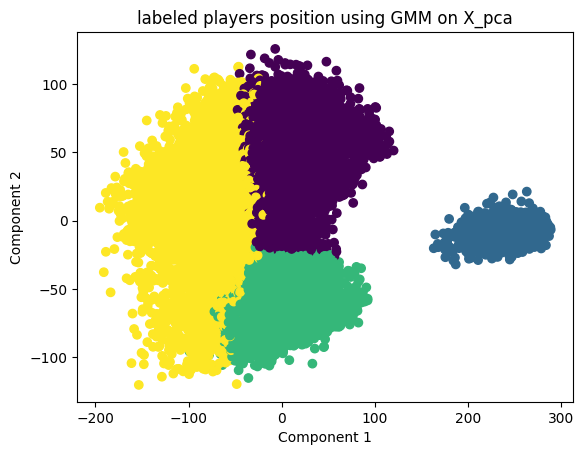

In [40]:
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=cluster_labels_gmm_pca)
plt.title('labeled players position using GMM on X_pca')
plt.xlabel('Component 1')
plt.ylabel('Component 2')

We decided to make a scatter plot of the predicted clustered GMM using PCA and UMAP’s structure. We noticed that the GMM using the PCA structure had correctly classified all of the goalkeepers, in comparison to KMeans. The general shapes of the UMAP and PCA on GMM’s predicted clusters were nearly identical to the KMeans predicted clusters we saw earlier, in terms of shape and how they drew the line between an attacker, defender, and midfielder. 

In [41]:
# calculate metrics 
silhouette_avg_gmm_pca = silhouette_score(X_pca, cluster_labels_gmm_pca)
print(f'Silhouette Score (GMM) using X_pca: {silhouette_avg_gmm_pca:.2f}')

ari_gmm = adjusted_rand_score(true_labels, cluster_labels_gmm_pca)
print(f'Adjusted Rand Index (GMM): {ari_gmm:.2f}')

Silhouette Score (GMM) using X_pca: 0.41
Adjusted Rand Index (GMM): 0.36


In [42]:
gmm = GaussianMixture(**best_params_2d)
cluster_labels_gmm_umap = gmm.fit_predict(X_umap)
cluster_labels_gmm_umap

array([1, 1, 0, ..., 1, 2, 2], dtype=int64)

Text(0, 0.5, 'Component 2')

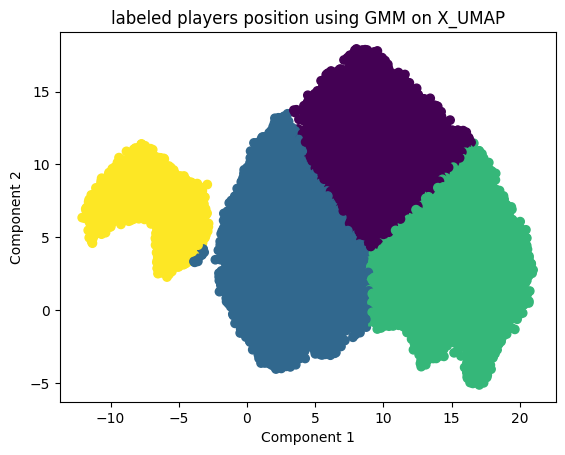

In [43]:
plt.scatter(X_umap[:, 0], X_umap[:, 1], c=cluster_labels_gmm_umap)
plt.title('labeled players position using GMM on X_UMAP')
plt.xlabel('Component 1')
plt.ylabel('Component 2')

In [44]:
# calculate metrics 
silhouette_avg_gmm = silhouette_score(X_umap, cluster_labels_gmm_umap)
print(f'Silhouette Score (GMM) using X_umap: {silhouette_avg_gmm:.2f}')

ari_gmm = adjusted_rand_score(true_labels, cluster_labels_gmm_umap)
print(f'Adjusted Rand Index (GMM): {ari_gmm:.2f}')

Silhouette Score (GMM) using X_umap: 0.43
Adjusted Rand Index (GMM): 0.41


The GMM using 2D embeddings achieved a silhouette score of 0.43, indicating reasonably well-separated clusters in the player statistics data. The model also attained an ARI of 0.41, suggesting a moderate level of agreement between the generated clusters and the true player positions. Overall, the GMM approach successfully partitioned the data into meaningful clusters corresponding to distinct player roles.

In [45]:
# 3D GMM
gmm_3d = GaussianMixture(**best_params_3d)
cluster_labels_gmm_3d = gmm_3d.fit_predict(X_umap_3d)
cluster_labels_gmm_3d

array([2, 2, 0, ..., 2, 2, 1], dtype=int64)

In [46]:
# 3D scatter plot for cluster_labels_gmm
fig = px.scatter_3d(
    x=X_umap_3d[:, 0],
    y=X_umap_3d[:, 1],
    z=X_umap_3d[:, 2],
    color=cluster_labels_gmm_3d,  # Color points by GMM cluster label
    title='3D UMAP Projection of the Dataset (Colored by GMM Clusters)'
)

fig.update_layout(
    scene=dict(
        xaxis_title='UMAP Component 1',
        yaxis_title='UMAP Component 2',
        zaxis_title='UMAP Component 3'
    ),
    margin=dict(l=0, r=0, b=0, t=0)
)

<img src="imgs/3d_umap_gmm.png" alt="3d_umap_gmm.png" title="3d_umap_gmm.png"/>

In [47]:
# calculate metrics 
silhouette_avg_3d = silhouette_score(X_umap_3d, cluster_labels_gmm_3d)
print(f'Silhouette Score (GMM on 3D UMAP): {silhouette_avg_3d:.2f}')

# adjusted rand index is same as 2d
ari_3d = adjusted_rand_score(true_labels, cluster_labels_gmm_3d)
print(f'Adjusted Rand Index (GMM on 3D UMAP): {ari_3d:.2f}')

Silhouette Score (GMM on 3D UMAP): 0.38
Adjusted Rand Index (GMM on 3D UMAP): 0.42


The GMM applied to 3D UMAP embeddings achieved a silhouette score of 0.39, indicating reasonable cluster separation in the player statistics data. With an ARI of 0.41, the model demonstrates a moderate level of agreement and the same score as the UMAP 2D structure. 

In [52]:
n_clusters = 4

gmm = GaussianMixture(n_components=n_clusters, random_state=42)

labels_pca_4 = gmm.fit_predict(pca_4)
labels_pca_5 = gmm.fit_predict(pca_5)
labels_umap_4 = gmm.fit_predict(umap_4)
labels_umap_5 = gmm.fit_predict(umap_5)

In [53]:
# Compute ARI for each clustering result
ari_pca_4 = adjusted_rand_score(true_labels, labels_pca_4)
ari_pca_5 = adjusted_rand_score(true_labels, labels_pca_5)
ari_umap_4 = adjusted_rand_score(true_labels, labels_umap_4)
ari_umap_5 = adjusted_rand_score(true_labels, labels_umap_5)

silhouette_avg_4d_PCAGMM = silhouette_score(pca_4, labels_pca_4)
print(f'Silhouette Score for 4D PCA with GMM: {silhouette_avg_4d_PCAGMM:.2f}')
silhouette_avg_5d_PCAGMM = silhouette_score(pca_5, labels_pca_5)
print(f'Silhouette Score for 5D PCA with GMM: {silhouette_avg_5d_PCAGMM:.2f}')
silhouette_avg_4d_umapGMM = silhouette_score(umap_4, labels_umap_4)
print(f'Silhouette Score for 4D UMAP with GMM: {silhouette_avg_4d_umapGMM:.2f}')
silhouette_avg_5d_umapGMM = silhouette_score(umap_5, labels_umap_5)
print(f'Silhouette Score for 5D UMAP with GMM: {silhouette_avg_5d_umapGMM:.2f}')

print(f"ARI for PCA 4D : {ari_pca_4}")
print(f"ARI for PCA 5D : {ari_pca_5}")
print(f"ARI for UMAP 4D : {ari_umap_4}")
print(f"ARI for UMAP 5D : {ari_umap_5}")


Silhouette Score for 4D PCA with GMM: 0.38
Silhouette Score for 5D PCA with GMM: 0.36
Silhouette Score for 4D UMAP with GMM: 0.49
Silhouette Score for 5D UMAP with GMM: 0.49
ARI for PCA 4 dimensions: 0.44082197394425743
ARI for PCA 5 dimensions: 0.44750391871272055
ARI for UMAP 4 dimensions: 0.40253719528227844
ARI for UMAP 5 dimensions: 0.40898452111225575


We also conducted 4D and 5D representations of PCA and UMAP to our GMM. We found that the highest ARI score was yielded when we used 5D PCA with GMM with a score of 0.447 which was much higher than what we got in our other pipelines. Similarly, our 5D UMAP with GMM yielded a silhouette score of 0.49. 

**Hyperparameter Tuning For GMM**

We tuned two pipelines that used Gaussian Mixture Models for clustering: one that uses UMAP and one that uses PCA for dimensionality reduction. For both, the Gaussian Mixture Model hyperparameters that were tuned were the covariance type, where we tried a full covariance matrix and diagonal covariance matrix, and weight initialization methods, where we tried K-Means and random initializations. Just like with the K-Means and PCA pipeline, we tuned the number of components by trying 2 to 5 components. However, for the UMAP and GMM pipeline, we tuned just the number of components and the number of neighbors. This is because our results for the KMeans and UMAP pipeline showed that when the minimum distance hyperparameter was set to 0.1, it had similar adjusted rand indexes but much higher silhouette scores than when it was set to 0.5 or 1, so we decided to keep minimum distance set to only 0.1.


For the GMM and PCA pipeline, we found that the set of hyperparameters that achieved the best-adjusted rand index, 0.447, was 5 principal components, full covariance matrix, and K-Means weight initialization. The set of hyperparameters that achieved the best silhouette score, 0.448, was the same except there were 2 principal components instead of 5. This suggests that having more principal components, and therefore keeping more of the variance in the data, allows for better clustering and that there isn’t much variance due to noise, but is worse for achieving dense and well-separated clusters because the extra variance makes it more spread out.


For the GMM and UMAP pipeline, we found that the set of hyperparameters that achieved the best-adjusted rand index, 0.498, and the highest silhouette score of .62  was 3 components and 15 neighbors for UMAP and a full covariance matrix and K-Means weight initialization for GMM. The set of hyperparameters that achieved the highest silhouette score was the same except the weight initialization was random instead of K-Means. 

These are the best hyperparameters that we got after hyper tuning. 

Getting the best hyper parameter calculation code is in dim_reduction.ipynb.

In [51]:
# Best Hyper parameter 3d plots with gmm predictions

umap = UMAP(n_jobs=-1, min_dist = 0.1, n_components = 3, n_neighbors = 15)

gmm = GaussianMixture(random_state=42, covariance_type =  'full', init_params = 'kmeans', n_components = 4, tol = 0.001)

X_umap = umap.fit_transform(X_scaled)

pred = gmm.fit_predict(X_umap)

fig = px.scatter_3d(
    x=X_umap[:, 0],
    y=X_umap[:, 1],
    z=X_umap[:, 2],
    color=pred,  # Color points by GMM cluster label
    title='3D UMAP Projection of the Dataset (Colored by GMM Clusters), ARI=0.498'
)

fig.update_layout(
    scene=dict(
        xaxis_title='UMAP Component 1',
        yaxis_title='UMAP Component 2',
        zaxis_title='UMAP Component 3'
    ),
    margin=dict(l=0, r=0, b=0, t=0)
)

<img src="imgs/3d_best_3d.png" alt="3d_best_3d.png" title="3d_best_3d.png"/>

In [55]:
# Best Hyper parameter 3d plots with true labels
fig = px.scatter_3d(
    x=X_umap[:, 0],
    y=X_umap[:, 1],
    z=X_umap[:, 2],
    color=true_labels,
    title='3D UMAP Projection of the Dataset (Colored by GMM True Labels)'
)

fig.update_layout(
    scene=dict(
        xaxis_title='UMAP Component 1',
        yaxis_title='UMAP Component 2',
        zaxis_title='UMAP Component 3'
    ),
    margin=dict(l=0, r=0, b=0, t=0)
)

<img src="imgs/3d_best_true.png" alt="3d_best_true.png" title="3d_best_true.png"/>

# Discussion

### Interpreting the result


After working with our data, through dimensionality reduction and clustering we can reliably group players into positions accurately as shown by our ARI and silhouette scores based on players' similarities and differences with each other. Our best ARI score, 0.498, from one of our pipelines with UMAP and GMM indicates that there is a fair amount of similarity between the predicted clusters and true clusters, which shows that the statistics we used in our data allowed us to make fairly accurate predictions. Additionally, the best silhouette score, 0.62, also came from the same pipeline that had the best ARI score. This silhouette score indicates that the clusters made by this pipeline are somewhat dense and well separated from each other, which aids the performance of the Gaussian Mixture Model. 
<br>

One reason for the inaccuracy that is in the predicted clusters could be due to soccer players being asked to perform a multitude of roles within a game, such as inverted fullbacks who are defenders but in attacking phases in the gameplay as midfielders. One interesting data point that illustrates this phenomenon is a player by the name of Oleksander Zinchenko; while listed in the game as a defender, his highest rating in the game is received when he is put in midfield rather than the position the game assigns him. Hundreds of these confounds exist due to the fluid nature of the sport and the way coaches and teams ask their players to play the game, making it increasingly difficult to classify players who themselves struggle to be classified as solely defenders or midfielders. 
<br>

This issue can be seen in the 2-D representations as they struggle to draw clear lines and boundaries that consistently represent the true positions. When looking at the graph that displays the true positions that are created by using PCA analysis, the attackers and defenders were relatively concentrated while some players from both categories were grouped in with the midfielders. This is likely due to the positional fluidity of the midfielder position. Midfielders had a small cluster in between with attackers and defenders but were widely spread out throughout the data. While the 2-D analysis with GMM was the best at separating the main clusters it still did an imperfect job with 3-D models doing a better job of representing this positional complexity that struggled to be represented in the 2-D models. 
<br>

The UMAP does an exceptional job of showing off the position groupings with the added dimensionality showing a better grouping of the true positions. While not all players are in their main cluster fitting their position a much greater number are with the midfield position in particular being much less erratic. This translated seamlessly into the UMAP predictions of our data being able to accurately show the clusters rather than the very inaccurate clusters found in some of the 2-D analyses. When we explored having more dimensions the increase in dimensions was matched with better model performance to a limit with our best results coming with 3 dimensions. In fact with U-Map our best ARI and silhouette score as mentioned earlier in this section was 0.498 and 0.62 respectively when the minimum distance was .1 and the number of nearest neighbors was 15.
<br>


### Limitations

One of the limitations of the data was that rather than being real-world stats it was a large dataset created and maintained by EAFC. Using this data set was an easy way to maintain and test over a large database and normalize stats across all players. We were not able to find a real-world dataset comparable in size so settling for a larger dataset that may be slightly less accurate was ideal. While using video game data might seem that we are using arbitrarily created data, the stats are normalized for all players, and due to the pressure from the game fan base and fans of the sport, the stats are regularly updated and adjusted to keep a fairly accurate profile of every player in the game. Thus the concerns regarding the accuracy of the data while valid are not a major concern when trying to consider positional fit. If we were to have used the real world we would’ve been working with a dataset around 1/10 of the size we used, barely passing the minimum requirement. With the substantial size of our database, an increase in data wouldn’t have changed our ability for algorithms to succinctly construct player profiles and sort players into them. When exploring with more hyperparameters we saw that the greater the number of components the more accurate the model was at predicting the positions of players. Our models underwent extensive tuning for the hyperparameters to ensure we produced the best possible results. 

### Ethics & Privacy

Some ethical and privacy concerns to address would be to address not necessarily where our data was sourced from, but how it is used by EA Sports FC. The original data linked from Kaggle was from sofifa.com and has no copyright and a CC0:Public Domain license. SoFifa is a database used by EA Fifa/EAFC, and they calculate their stats based on different linear combinations of a player's main attributes. The privacy terms of image and name rights could be a concern for EA Sports. Sole ownership of image rights starts with the player, thereby prohibiting their exploitation without the player's explicit consent. When agreeing to be with a club, the player typically grants the club partial rights to their image, facilitating its incorporation into the club's marketing endeavors. If the player is selected to represent their national team, similar image rights are often extended to the national association.1 This falls more on EA Sports rather than the dataset for which we are using it, however it is still important to address.

### Conclusion


When tackling complex data such as the data found in this project, we concluded that controlling multiple variables and variations across players, their style of play, and how they function within their teams was that if the data is oversimplified it’s unable to correctly process and accurately sort players into their clusters. We see a few times in this project where our model gets an inaccurate prediction of a player’s position. This was something within our expectations when predicting our results. Given the complexity of soccer and the various playstyles, simple numbers from a video game struggle to emulate the characteristics of an individual player. This confusion is explored and discussed with hybrid positions such as inverted fullbacks. Players in these hybrid positions struggled to be classified by our model as they similarly struggled to be classified by professional analysts as well. The ability of our model to create a mostly clear and concise representation of players regardless of position and group them into playing styles would be more beneficial for real-world analysis rather than a 1:1 matching of their position as described in the video game. 


Despite all that, the project we’ve completed can help in the field of sports and data analytics by helping professional teams analyze their team and their opposition. For example, if a team loses a player due to an injury or any other reason they could use this type of analysis to find a cluster of players that fit the role that the player provided to their team. They could then find a suitable replacement. Also, it would help teams study the way their opponents play by looking at how many players the opponent has in each cluster letting them deduce the shape of the other team and their style of play. This is seen again with our clusters showing multiple defenders being grouped in the midfield cluster which would show the way their teams use that player as more of a midfielder rather than a defender throughout the game. This is backed by real-life trends in the sport forcing more defenders to step up and play in midfield. Future work that could be done in this field is to make a player similarity score metric and calculator. By doing this, working off how players are closely clustered and sorted based on having a similar profile could help teams find replacements for players that not only play the same position but do so in a similar style thus minimizing the friction the player would face while playing for their new team.

# Footnotes

<a name="hayennote"></a>1.[^](#hayen): Hayen, A. “Clustered data in sports research.” Journal of Science and Medicine in Sport, vol. 9, no. 1–2, May 2006, pp. 165–168, https://doi.org/10.1016/j.jsams.2006.02.003.<br>
<a name="akhanlinote"></a>2.[^](#akhanli): Akhanli, Serhat Emre, and Christian Hennig. “Clustering of football players based on performance data and aggregated clustering validity indexes.” Journal of Quantitative Analysis in Sports, vol. 19, no. 2, 16 May 2023, pp. 103–123, https://doi.org/10.1515/jqas-2022-0037.<br> 
<a name="sternnote"></a>3.[^](#stern): Stern, Alex "Clustering NBA Player Types: A Tutorial on K-Means, Gaussian Mixture Models, Principal Component Analysis, and Graphical Networks", https://alexcstern.github.io/hoopDown.html<br>
<a name="akhanlinote"></a>4.[^](#akhanli): Akhanli, Serhat Emre, and Christian Hennig. “Clustering of football players based on performance data and aggregated clustering validity indexes.” Journal of Quantitative Analysis in Sports, vol. 19, no. 2, 16 May 2023, pp. 103–123, https://doi.org/10.1515/jqas-2022-0037.<br> 
<a name="sternnote"></a>5.[^](#stern): Stern, Alex "Clustering NBA Player Types: A Tutorial on K-Means, Gaussian Mixture Models, Principal Component Analysis, and Graphical Networks", https://alexcstern.github.io/hoopDown.html
